# Finding blobs in 64x64 images using Unet, Conv3d

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from scipy.optimize import curve_fit
from PIL import Image
import random
import utils

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
data='/home/ubuntu/BRS_RNAFish/'

# Get data

Load data from file

In [3]:
shp=[4,512,512,4]

In [4]:
rot_both=utils.get_raw_float_image(data+'good-512v2-1.tif_RotShift.raw', shp)
idx=np.random.choice(rot_both.shape[0], replace=False, size=[200])
rot_data=rot_both[idx,:,:,:,0:2]/16384.0
rot_truth=rot_both[idx,:,:,:,2:4]/255.0
rot_both=0

In [5]:
rest_both=utils.get_raw_float_image(data+'Training-512v2.raw', shp)
rest_data=rest_both[:,:,:,:,0:2]/16384.0
rest_truth=rest_both[:,:,:,:,2:4]/255.0
rest_both=0

In [6]:
validation_both=utils.get_raw_float_image(data+'Validation-512.raw',shp)
validation_list=validation_both[:,:,:,:,0:2]/16384.0
validation_truth=validation_both[:,:,:,:,2:4]/255.0
validation_both=0

# Parse data

Mix the two datasets (rotated truths, normal images) and get training/validation sets

In [7]:
def get_data_and_truths(rots, rests):
    rot_subset=rot_data[rots,:,:,:,:]
    rot_mask_subset=rot_truth[rots,:,:,:,:]
    rest_subset=rest_data[rests, :,:,:, :]
    rest_mask_subset=rest_truth[rests, :,:,:,:]
    
    
    my_list=np.concatenate((rot_subset, rest_subset), axis=0)
    my_truth=np.concatenate((rot_mask_subset, rest_mask_subset), axis=0)
    return (my_list, my_truth)

In [8]:
#training_list,training_truth=get_data_and_truths(np.arange(0,13*101), np.arange(0,2000))

In [9]:
#validation_list,validation_truth=get_data_and_truths(np.arange(13*101,17*101), np.arange(2000,2700))

In [10]:
training_list=np.concatenate((rot_data, rest_data), axis=0)
training_truth=np.concatenate((rot_truth, rest_truth), axis=0)

# Design network

Define a function to create a convolutional layer, including conv, relu, maxpool, that can be called multiple times

In [11]:
#Input and output
x=tf.placeholder(dtype=tf.float32, shape=[None, 4, 512,512,2])
y=tf.placeholder(dtype=tf.float32, shape=[None, 4, 512,512,2])

xr=x
yr=y

base_scaler=32

#Going down
A1=utils.leaky_relu(tf.layers.conv3d(xr, base_scaler, [3,3,3], padding='SAME'))
A2=utils.leaky_relu(tf.layers.conv3d(A1, base_scaler, [3,3,3], padding='SAME'))

B0=tf.nn.max_pool3d(A2, ksize=[1,1,2,2,1], strides=[1,1,2,2,1], padding='SAME')
B1=utils.leaky_relu(tf.layers.conv3d(B0, 2*base_scaler, [3,3,3], padding='SAME'))
B2=utils.leaky_relu(tf.layers.conv3d(B1, 2*base_scaler, [3,3,3], padding='SAME'))

C0=tf.nn.max_pool3d(B2, ksize=[1,2,2,2,1], strides=[1,2,2,2,1], padding='SAME')
C1=utils.leaky_relu(tf.layers.conv3d(C0, 4*base_scaler, [3,3,3], padding='SAME'))
C2=utils.leaky_relu(tf.layers.conv3d(C1, 4*base_scaler, [3,3,3], padding='SAME'))

D0=tf.nn.max_pool3d(C2, ksize=[1,1,2,2,1], strides=[1,1,2,2,1], padding='SAME')
D1=utils.leaky_relu(tf.layers.conv3d(D0, 8*base_scaler, [3,3,3], padding='SAME'))
D2=utils.leaky_relu(tf.layers.conv3d(D1, 8*base_scaler, [3,3,3], padding='SAME'))

E0=tf.nn.max_pool3d(D2, ksize=[1,2,2,2,1], strides=[1,2,2,2,1], padding='SAME')
E1=utils.leaky_relu(tf.layers.conv3d(E0, 16*base_scaler, [3,3,3], padding='SAME'))
E2=utils.leaky_relu(tf.layers.conv3d(E1, 16*base_scaler, [3,3,3], padding='SAME'))



#Coming up
DD0=tf.layers.conv3d_transpose(E2, 8*base_scaler, kernel_size=[3,3,3], strides=[2,2,2], padding='SAME', use_bias=False)
DD1=tf.concat(axis=4, values=[DD0,D2])
DD2=utils.leaky_relu(tf.layers.conv3d(DD1, 8*base_scaler, [3,3,3], padding='SAME'))
DD3=utils.leaky_relu(tf.layers.conv3d(DD2, 8*base_scaler, [3,3,3], padding='SAME'))

CC0=tf.layers.conv3d_transpose(DD3, 4*base_scaler, kernel_size=[3,3,3], strides=[1,2, 2], padding='SAME', use_bias=False)
CC1=tf.concat(axis=4, values=[CC0,C2])
CC2=utils.leaky_relu(tf.layers.conv3d(CC1, 4*base_scaler, [3,3,3], padding='SAME'))
CC3=utils.leaky_relu(tf.layers.conv3d(CC2, 4*base_scaler, [3,3,3], padding='SAME'))

BB0=tf.layers.conv3d_transpose(CC3, 2*base_scaler, kernel_size=[3,3,3], strides=[2,2, 2], padding='SAME', use_bias=False)
BB1=tf.concat(axis=4, values=[BB0,B2])
BB2=utils.leaky_relu(tf.layers.conv3d(BB1, 2*base_scaler, [3,3,3], padding='SAME'))
BB3=utils.leaky_relu(tf.layers.conv3d(BB2, 2*base_scaler, [3,3,3], padding='SAME'))

AA0=tf.layers.conv3d_transpose(BB3, base_scaler, kernel_size=[3,3,3], strides=[1,2, 2], padding='SAME', use_bias=False)
AA1=tf.concat(axis=4, values=[AA0,A2])
AA2=utils.leaky_relu(tf.layers.conv3d(AA1, base_scaler, [3,3,3], padding='SAME'))
AA3=utils.leaky_relu(tf.layers.conv3d(AA2, base_scaler, [3,3,3], padding='SAME'))

logits=utils.leaky_relu(tf.layers.conv3d(AA3, 2, [1,1,1], padding='SAME'))
probs=tf.tanh(logits)

diff=tf.subtract(probs, yr)
LSQ=tf.multiply(diff,diff)
OutError, MaskError=tf.split(LSQ, [1,1], 4)
loss=10*tf.reduce_mean(OutError)+0.1*tf.reduce_mean(MaskError)
#loss=tf.reduce_mean(LSQ)

train_op=tf.train.AdamOptimizer(learning_rate=0.0001).minimize(loss)



# Training on easy set

0
Training loss:  0.012896021
Validation loss:  0.0148828495


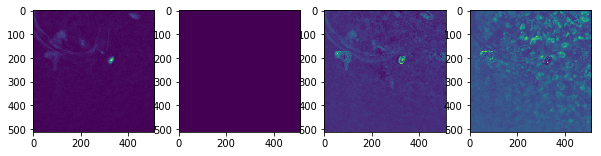

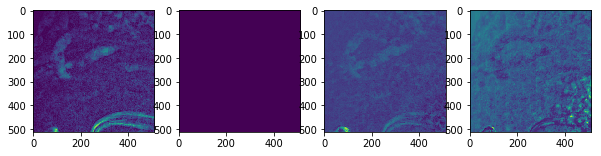

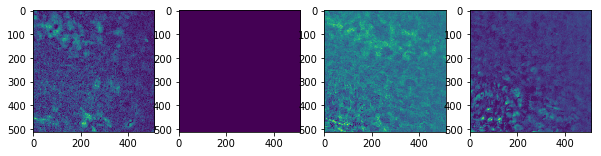

30
Training loss:  0.02365186
Validation loss:  0.010874681


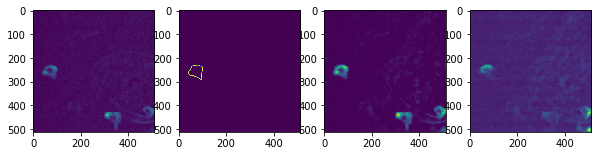

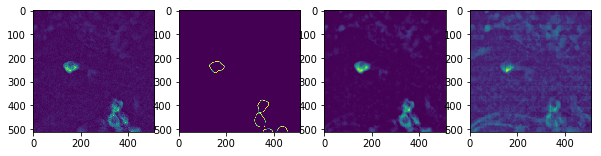

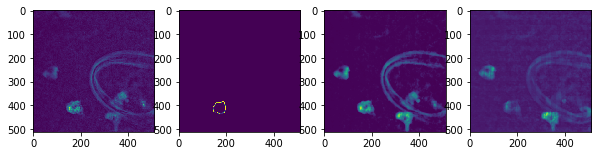

60
Training loss:  0.030018393
Validation loss:  0.008373922


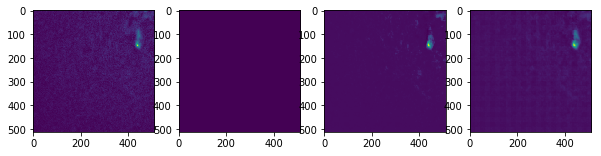

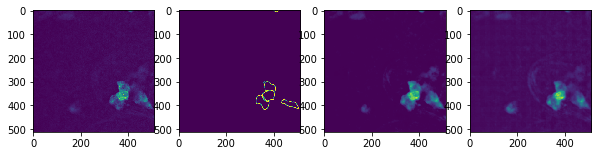

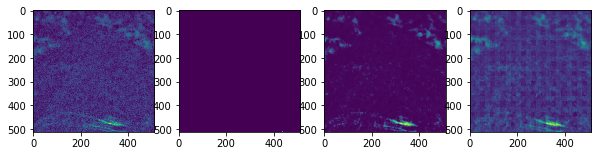

90
Training loss:  0.008368558
Validation loss:  0.011748952


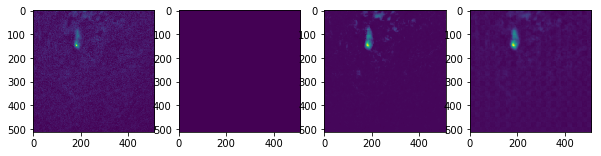

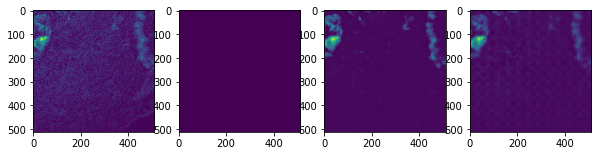

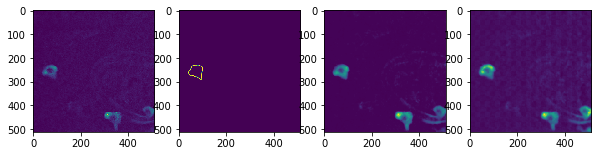

120
Training loss:  0.044165947
Validation loss:  0.01534642


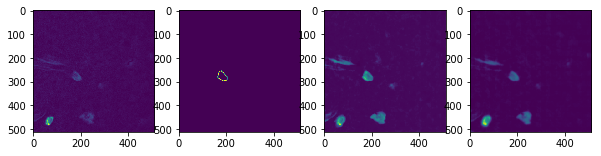

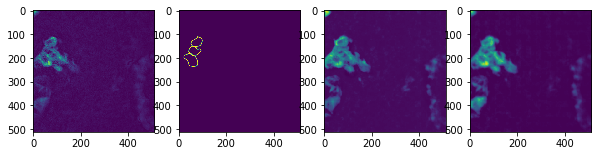

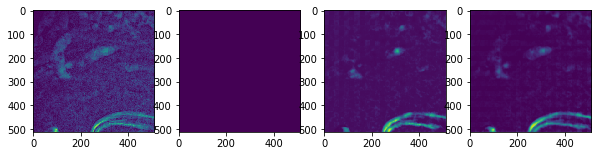

150
Training loss:  0.046614654
Validation loss:  0.024361089


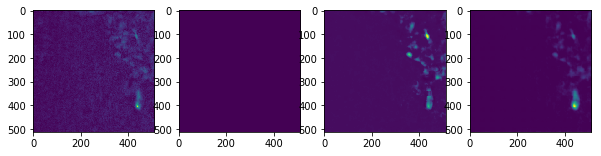

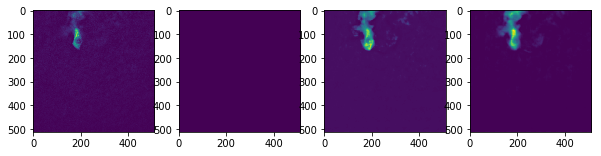

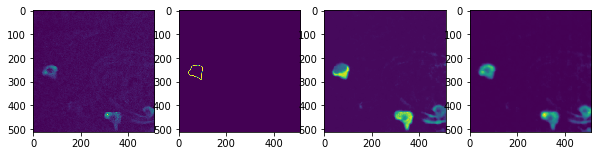

180
Training loss:  0.02055979
Validation loss:  0.0080597475


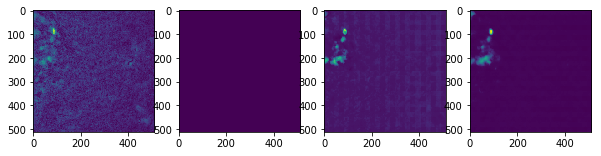

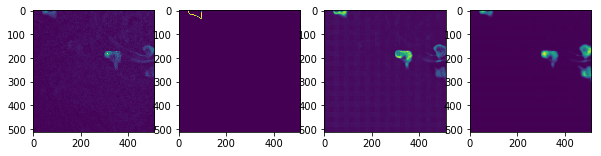

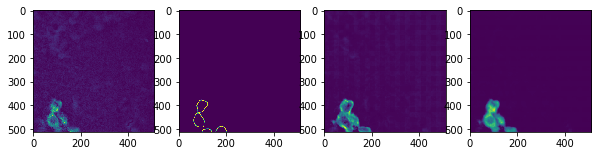

210
Training loss:  0.0012401743
Validation loss:  0.016281793


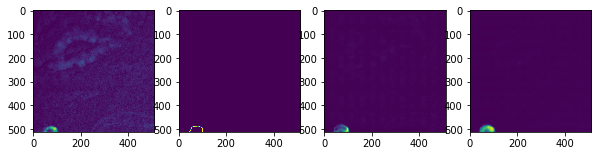

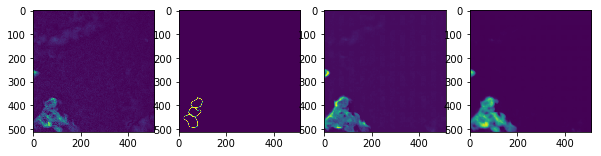

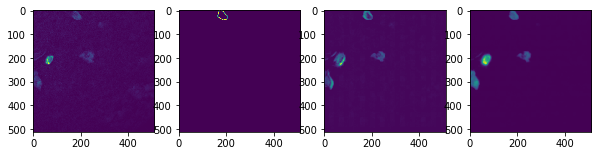

240
Training loss:  0.018611869
Validation loss:  0.01448604


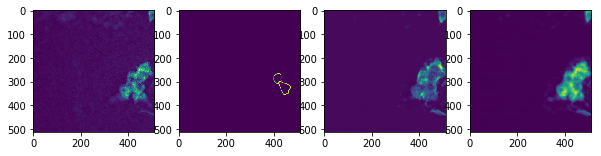

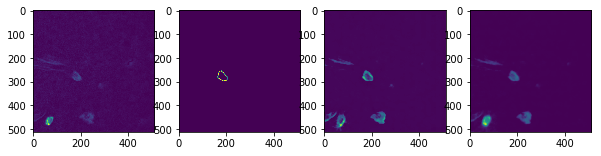

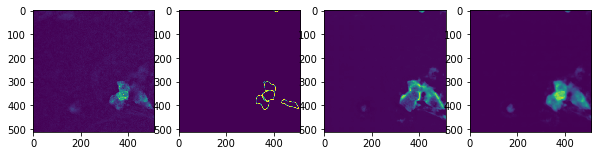

270
Training loss:  0.022745496
Validation loss:  0.012763887


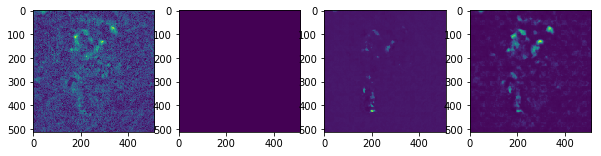

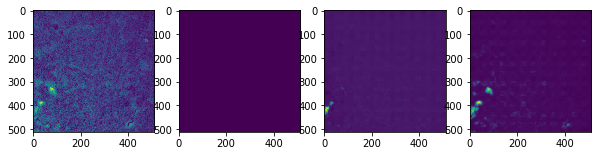

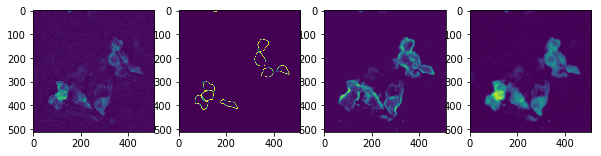

300
Training loss:  0.037256155
Validation loss:  0.016220812


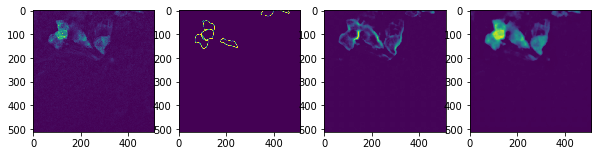

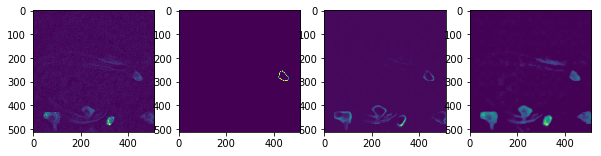

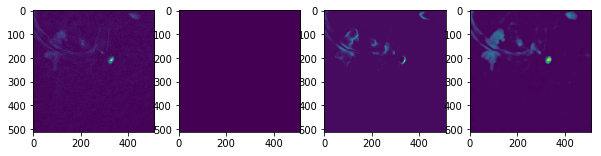

330
Training loss:  0.009322786
Validation loss:  0.010601617


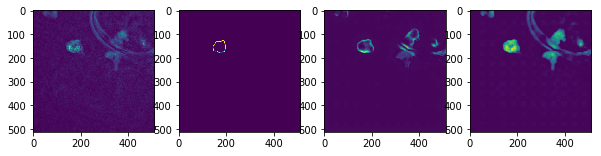

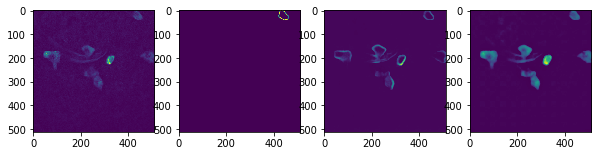

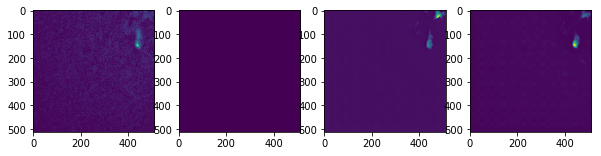

360
Training loss:  0.021969818
Validation loss:  0.009944846


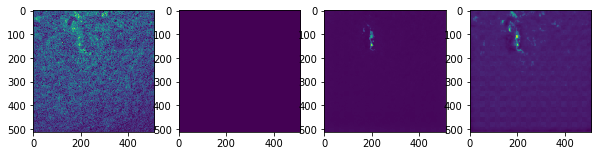

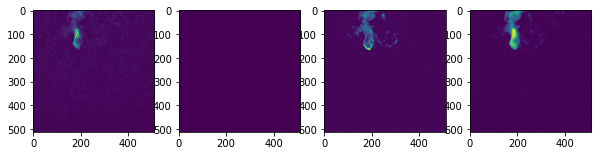

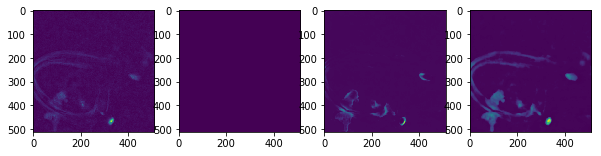

390
Training loss:  0.012506659
Validation loss:  0.025025975


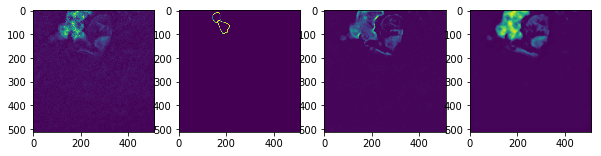

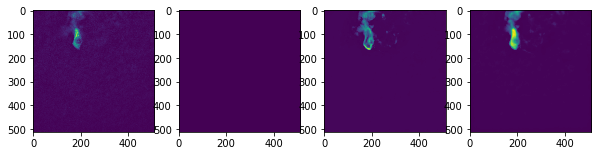

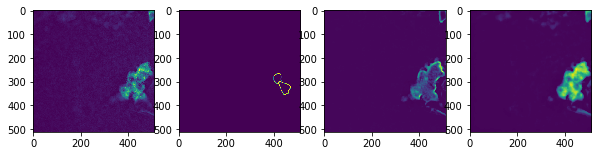

420
Training loss:  0.0055922414
Validation loss:  0.021629186


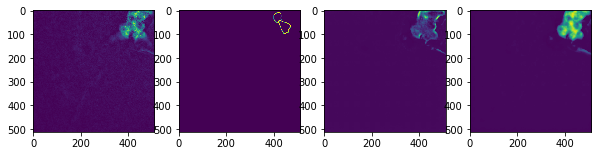

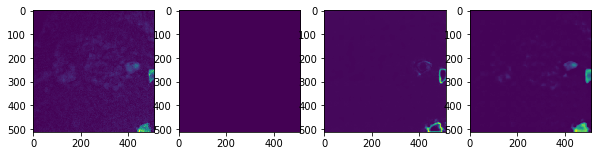

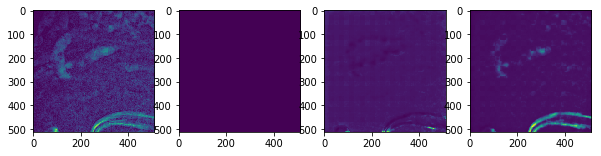

450
Training loss:  0.018048622
Validation loss:  0.017981844


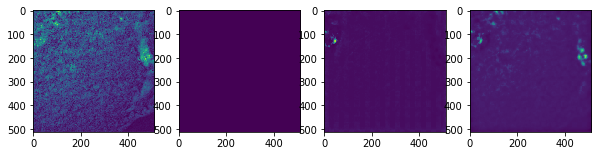

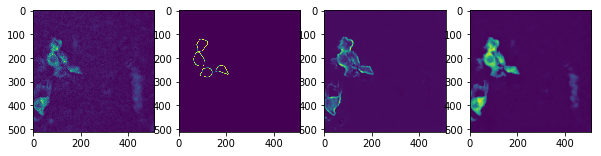

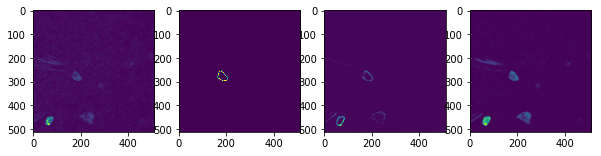

480
Training loss:  0.022646988
Validation loss:  0.008311521


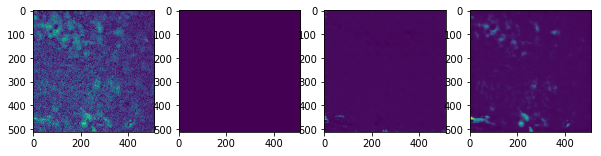

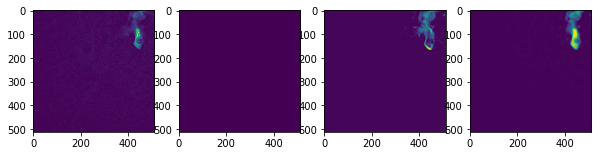

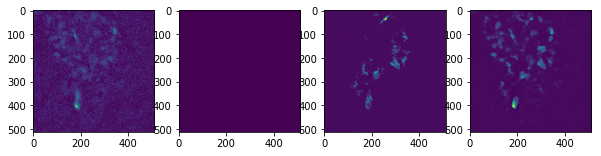

510
Training loss:  0.020152053
Validation loss:  0.016717007


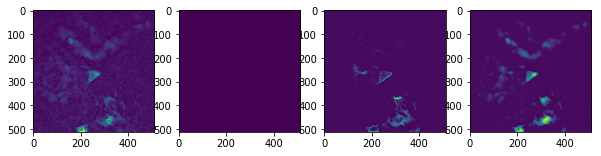

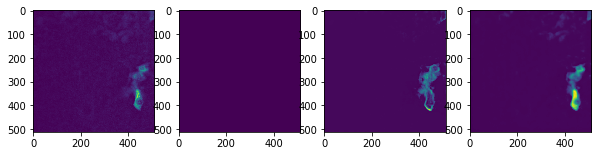

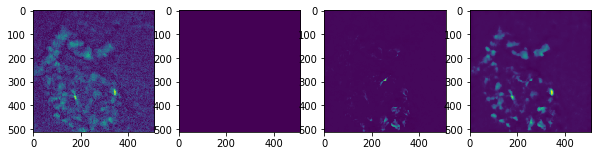

540
Training loss:  0.022249995
Validation loss:  0.010045616


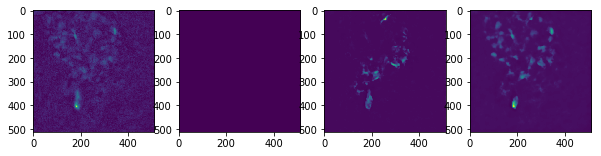

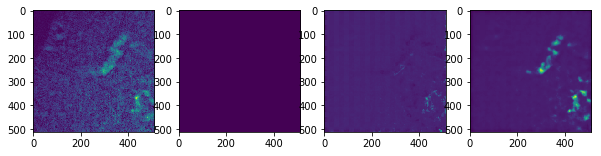

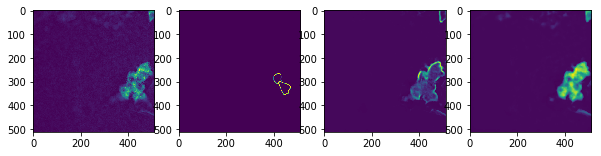

570
Training loss:  0.003301719
Validation loss:  0.01593791


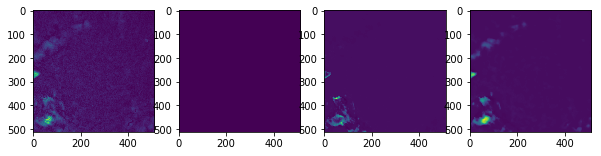

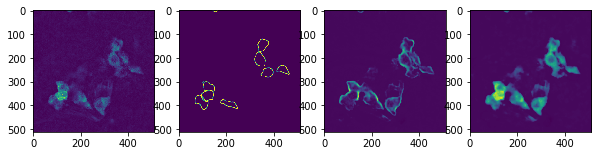

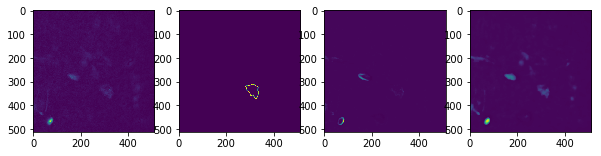

600
Training loss:  0.0090136845
Validation loss:  0.02196915


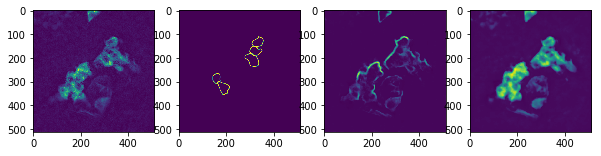

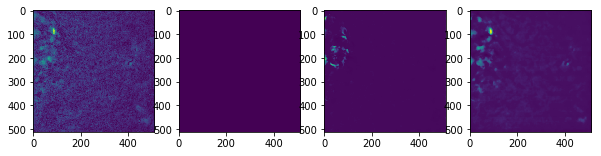

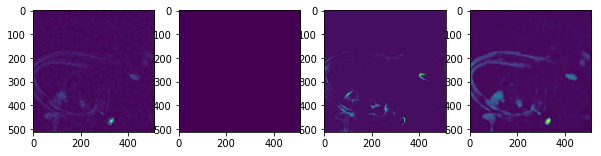

630
Training loss:  0.010933353
Validation loss:  0.017780313


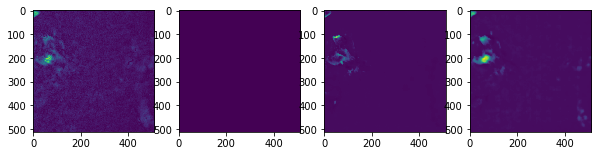

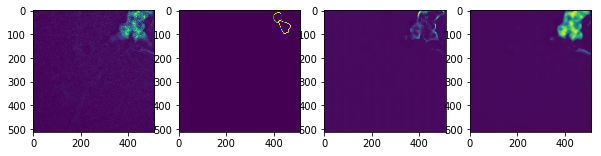

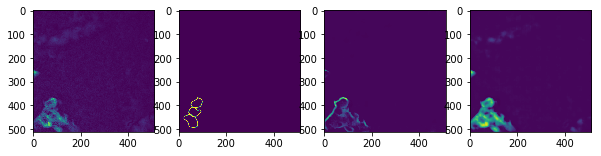

660
Training loss:  0.02829415
Validation loss:  0.0129765915


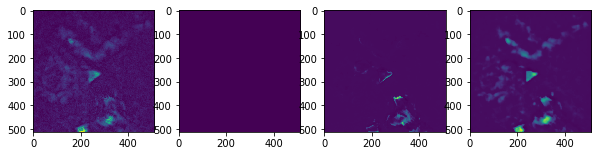

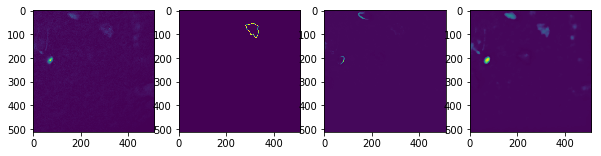

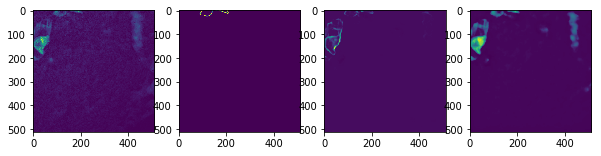

690
Training loss:  0.0018384823
Validation loss:  0.011322461


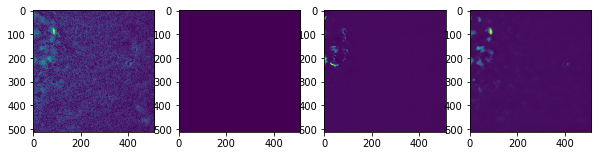

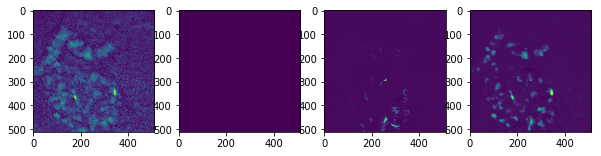

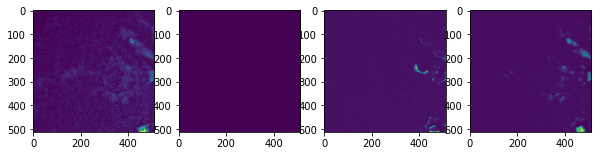

720
Training loss:  6.7199166e-05
Validation loss:  0.016537244


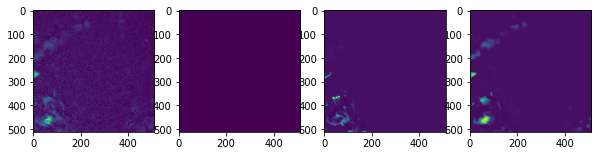

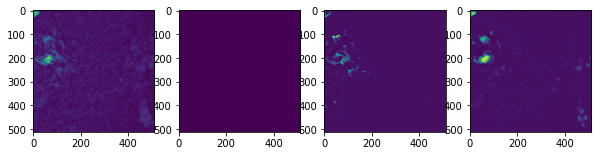

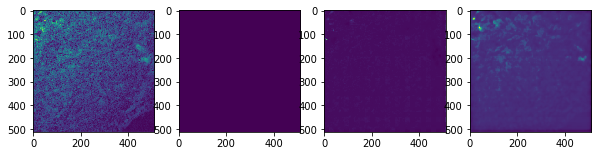

750
Training loss:  0.02182202
Validation loss:  0.006204703


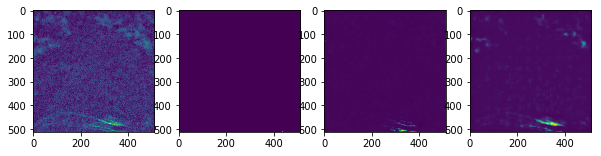

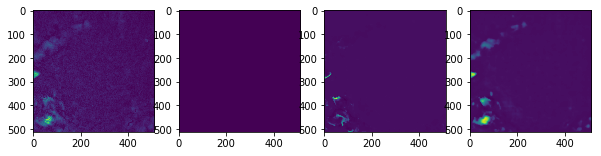

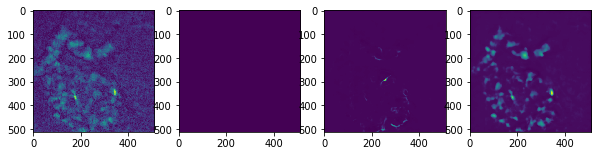

780
Training loss:  0.019574892
Validation loss:  0.008364365


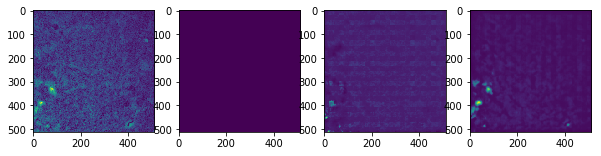

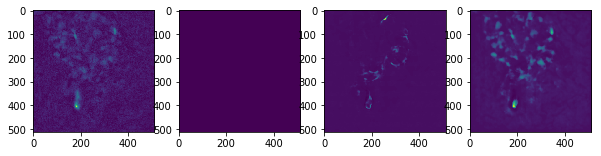

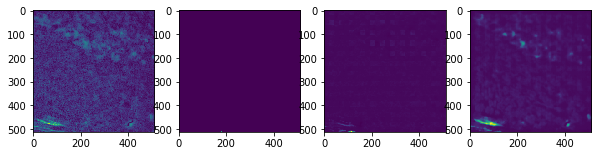

810
Training loss:  2.8607754e-05
Validation loss:  0.015710587


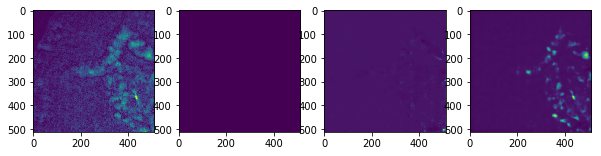

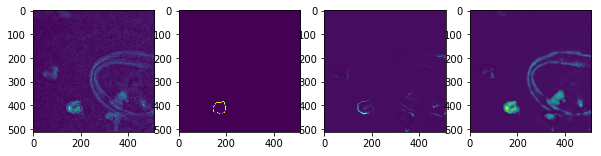

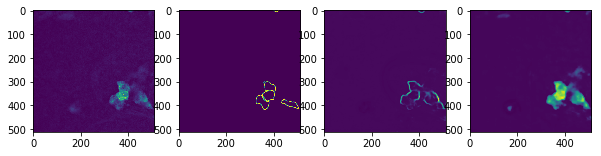

840
Training loss:  0.0163815
Validation loss:  0.005547197


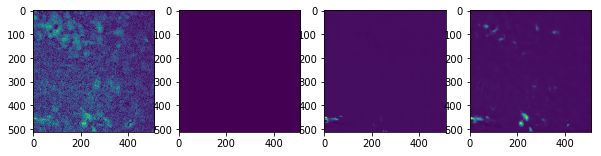

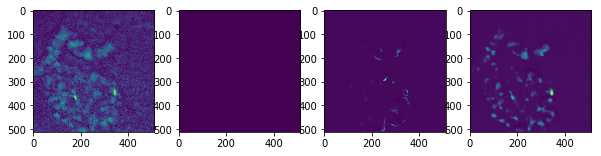

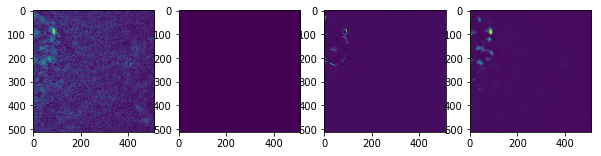

870
Training loss:  0.011913132
Validation loss:  0.015423084


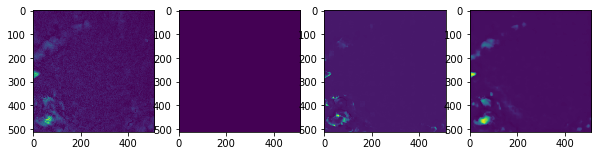

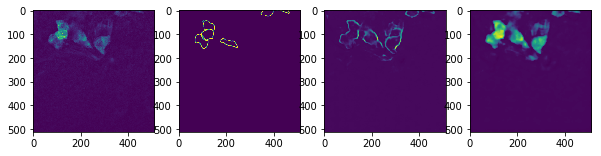

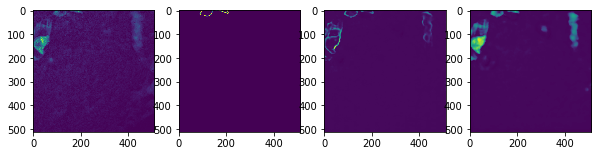

900
Training loss:  0.023246074
Validation loss:  0.009022749


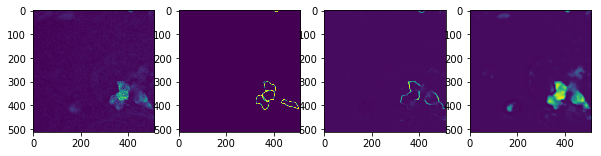

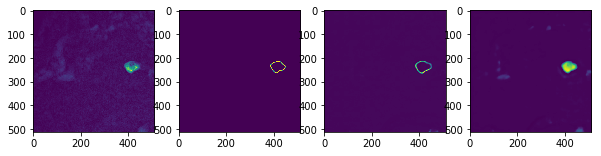

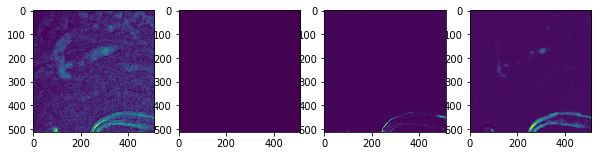

930
Training loss:  0.009164439
Validation loss:  0.023783047


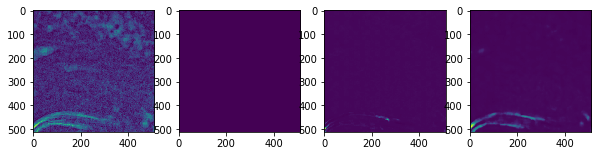

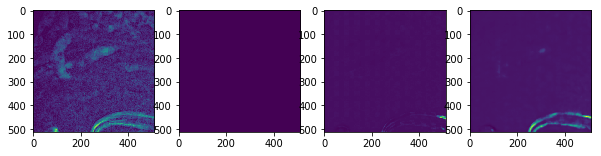

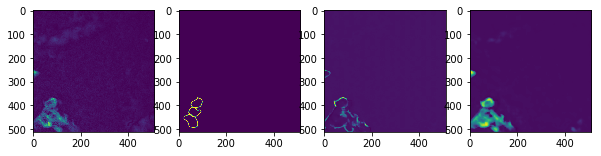

960
Training loss:  0.021349188
Validation loss:  0.01368596


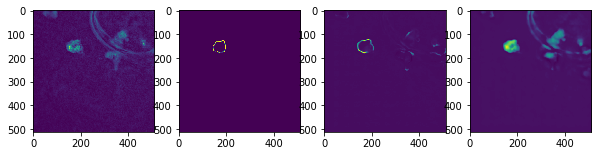

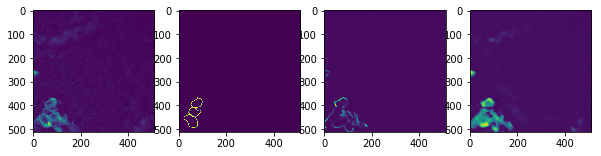

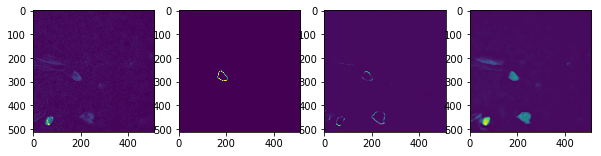

990
Training loss:  0.009085438
Validation loss:  0.0071576983


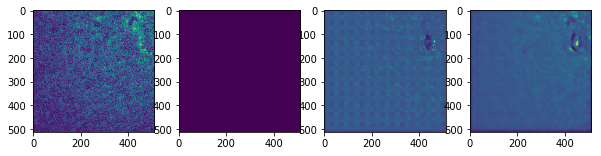

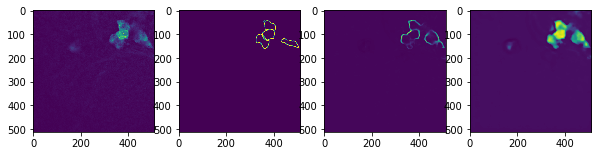

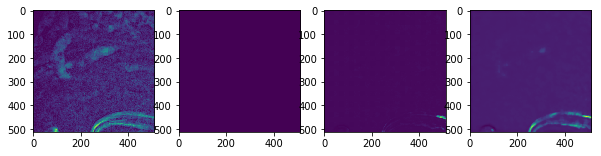

1020
Training loss:  0.023527274
Validation loss:  0.010553687


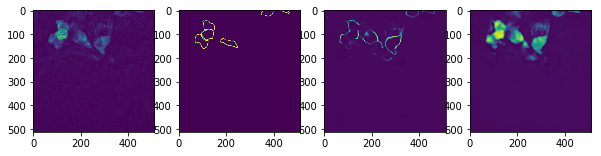

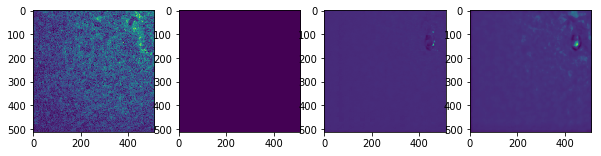

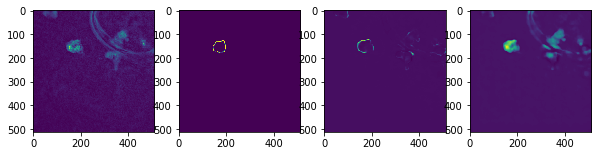

1050
Training loss:  0.017702408
Validation loss:  0.009466195


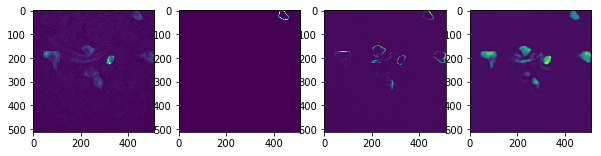

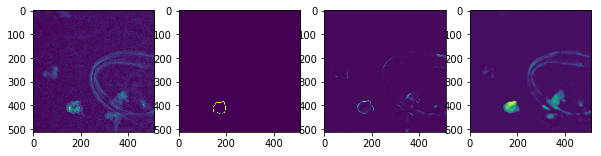

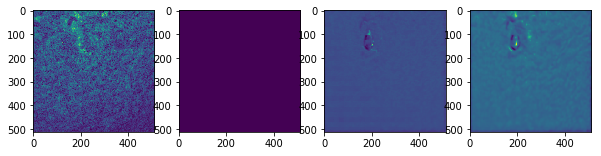

1080
Training loss:  0.020255962
Validation loss:  0.011566728


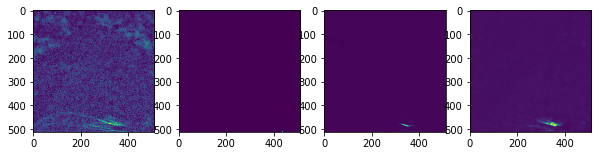

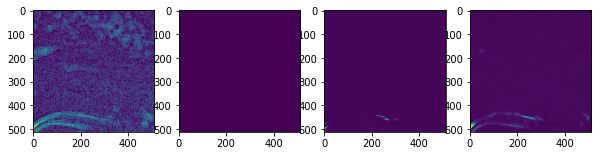

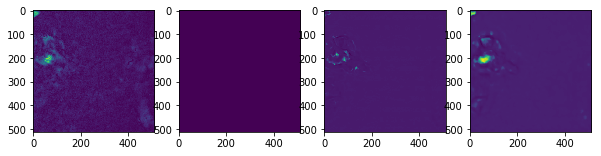

1110
Training loss:  0.030356556
Validation loss:  0.009607096


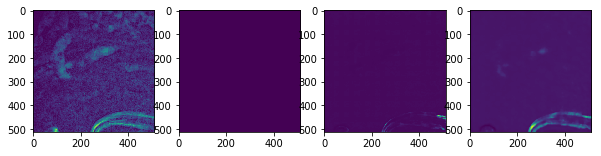

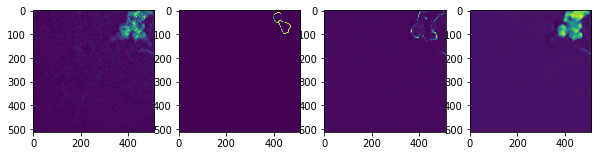

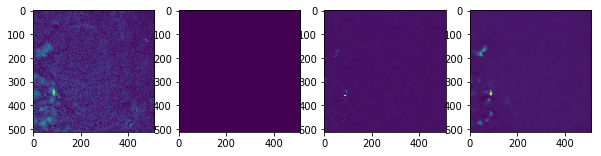

1140
Training loss:  0.018755198
Validation loss:  0.020143664


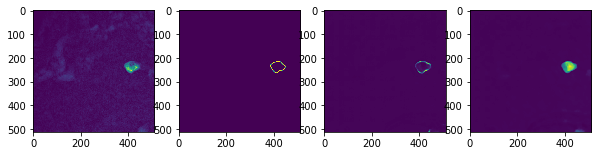

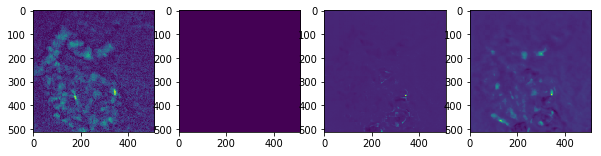

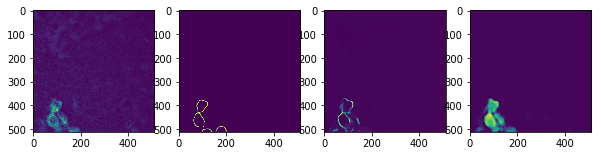

1170
Training loss:  0.0063847513
Validation loss:  0.0067990827


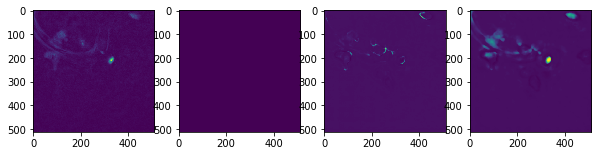

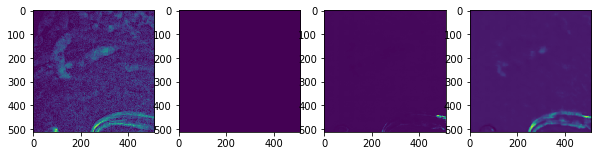

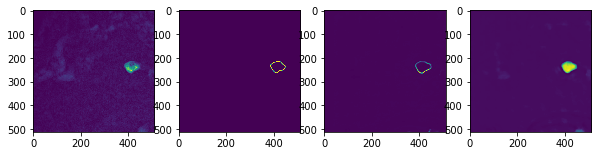

1200
Training loss:  0.0055438904
Validation loss:  0.006445836


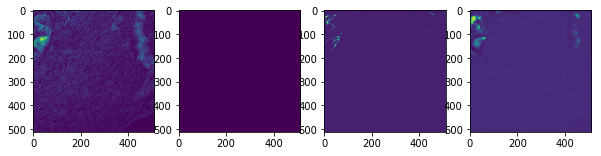

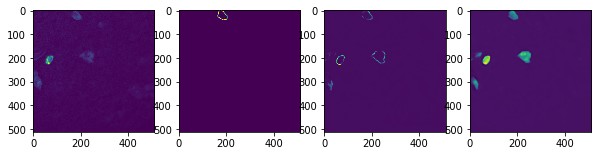

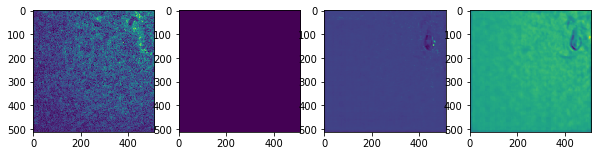

1230
Training loss:  0.00907873
Validation loss:  0.014469861


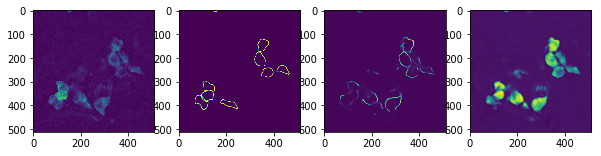

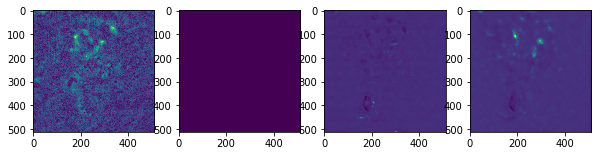

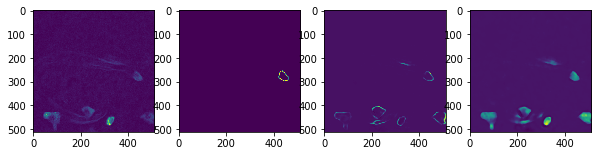

1260
Training loss:  0.009970433
Validation loss:  0.012338935


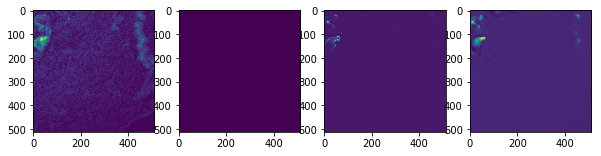

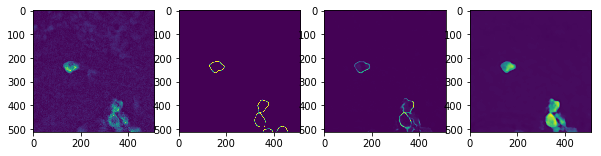

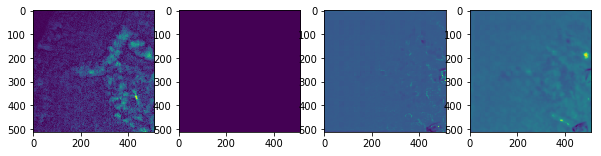

1290
Training loss:  0.0005884159
Validation loss:  0.017900031


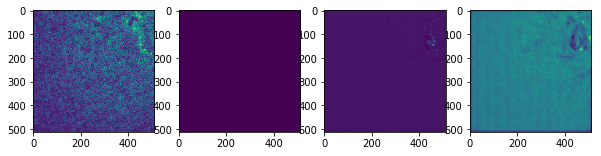

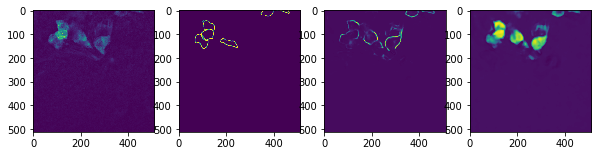

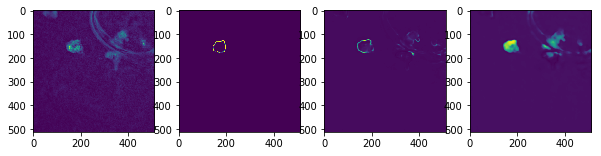

1320
Training loss:  0.0053494363
Validation loss:  0.007938275


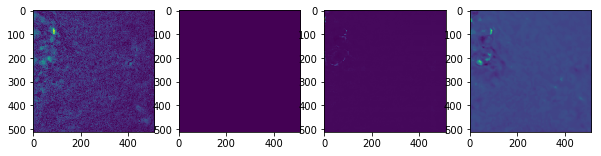

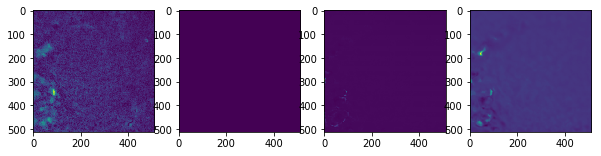

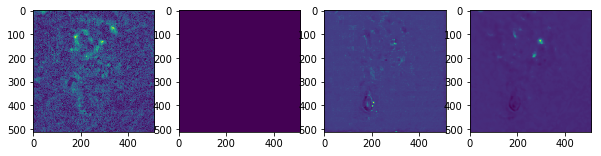

1350
Training loss:  0.0024413997
Validation loss:  0.004727337


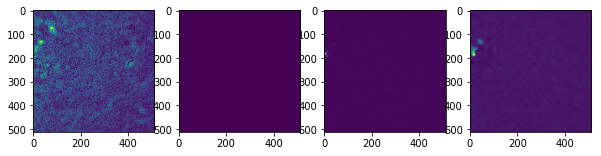

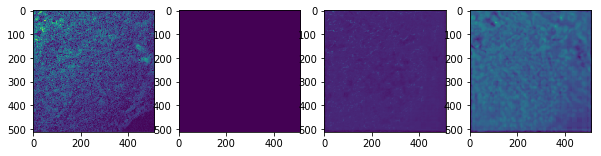

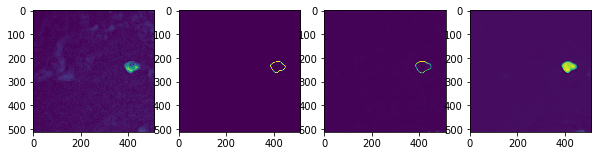

1380
Training loss:  0.004031724
Validation loss:  0.027203625


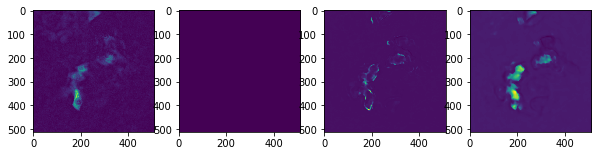

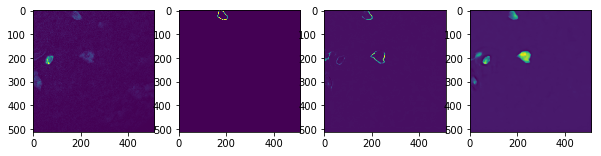

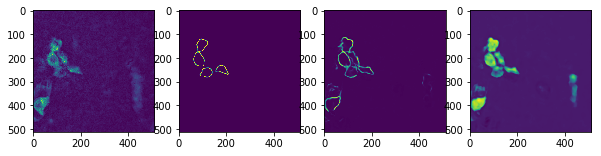

1410
Training loss:  0.0069010756
Validation loss:  0.021794247


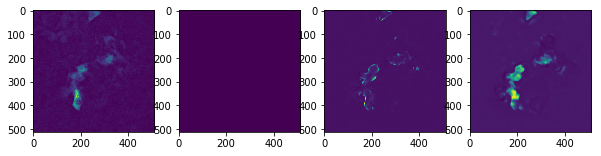

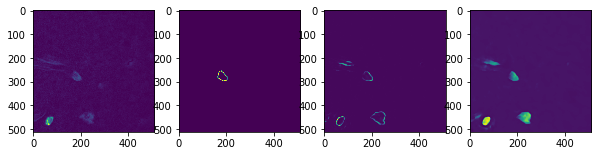

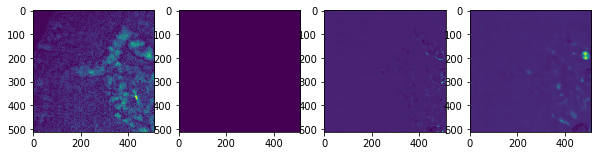

KeyboardInterrupt: 

In [12]:
tf.set_random_seed(123456)
sess=tf.Session()
sess.run(tf.global_variables_initializer())

for i in range(20000):
    idx=np.random.choice(training_list.shape[0], replace=False, size=[4])
    cur_train=training_list[idx,:,:,:,:]
    cur_truth=training_truth[idx,:,:,:,:]
    _,results, losses=sess.run([train_op, probs, loss], feed_dict={x:cur_train, y:cur_truth})
    if (i%30==0):
        print(i)
        print("Training loss: ",losses)
        idx=np.random.choice(validation_list.shape[0], replace=False, size=[4])
        #idx=range(0,300)
        sub_validation_data=validation_list[idx, :,:,:,:]
        sub_validation_truth=validation_truth[idx, :,:,:,:]
        results, losses, a=sess.run([probs, loss, A1], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        print("Validation loss: ",losses)
        ti=0
        utils.plot_4x1(sub_validation_data[ti,0,:,:,0], sub_validation_truth[ti,0,:,:,0], results[ti,0,:,:,0], results[ti,0,:,:,1])
        plt.show()
        ti=1
        utils.plot_4x1(sub_validation_data[ti,0,:,:,0], sub_validation_truth[ti,0,:,:,0], results[ti,0,:,:,0], results[ti,0,:,:,1])
        plt.show()
        ti=2
        utils.plot_4x1(sub_validation_data[ti,0,:,:,0], sub_validation_truth[ti,0,:,:,0], results[ti,0,:,:,0], results[ti,0,:,:,1])
        plt.show()

# Process new data

In [14]:
def process_file(sess, file_name):
    true_test2_data=utils.get_raw_float_image(file_name, [4,512,512,2])[:,:,:,:,0:2]/16384.0
    num_images=true_test2_data.shape[0]
    output=np.zeros([num_images,4,512,512,2])
    process_batch_size=4
    for t in range(0,num_images,process_batch_size):
        endrng=np.min((t+process_batch_size,num_images))
        sub_validation_data=true_test2_data[t:(t+process_batch_size), :,:,:,:]
        sub_validation_truth=validation_truth[0:sub_validation_data.shape[0], :,:,:,:]
        results, losses, a=sess.run([probs, loss, A1], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        output[t:(t+process_batch_size)]=results
    output=np.swapaxes(np.swapaxes(output,4,3),3,2)
    np.place(output, output<0, 0)
    (output*255.0).astype(np.uint8).tofile(file_name[0:-4]+'_output_new.raw')
    print(file_name[0:-4]+'_output.raw')
    return output


In [15]:
output=process_file(sess,data+'Real_wt12-14hr-3.raw')

/home/ubuntu/BRS_RNAFish/Real_wt12-14hr-3_output.raw


In [29]:
shp

[4, 512, 512, 4]

In [25]:
np.place(output, output<0, 0)

In [26]:
np.min(output)

0.0

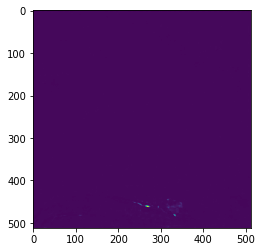

In [19]:
plt.imshow(output[12,2,0,:,:])

In [67]:
true_test2_data=utils.get_raw_float_image(data+'Validation-512.raw', shp)[:,:,:,:,0:2]/16384.0

In [48]:
output.shape

(63, 4, 2, 512, 512)

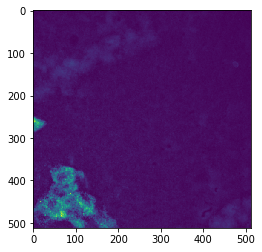

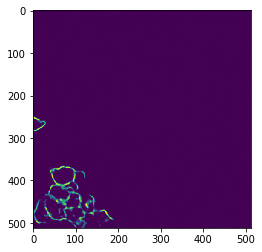

In [75]:
ix=16
plt.imshow(np.max(true_test2_data[ix,:,:,:,0], axis=0))
plt.figure()
plt.imshow(np.max(output[ix,:,0,:,:], axis=0))

In [44]:
tf.saved_model.simple_save(sess, data+'model', inputs={"x":x, "y":y}, outputs={"probs":probs, "loss":loss, "A1":A1})

INFO:tensorflow:Assets added to graph.
INFO:tensorflow:No assets to write.
INFO:tensorflow:SavedModel written to: b'/home/ubuntu/BRS_RNAFish/model/saved_model.pb'


In [ ]:
rest_both=utils.get_raw_float_image(data+'Training-128.raw', shp)
rest_data=rest_both[:,:,:,:,0:2]/16384.0
rest_truth=rest_both[:,:,:,:,2:4]/255.0
rest_both=0

# Trying validation data

In [7]:
sub_range=range(0,3)
sub_validation_data=validation_data[sub_range, :,:,:]
sub_validation_truth=validation_truth[sub_range, :,:,:, :]
results, LN,losses=sess.run([probs, LSQ, loss], feed_dict={x:sub_validation_data, y:sub_validation_truth})
losses

0.0011763077

36


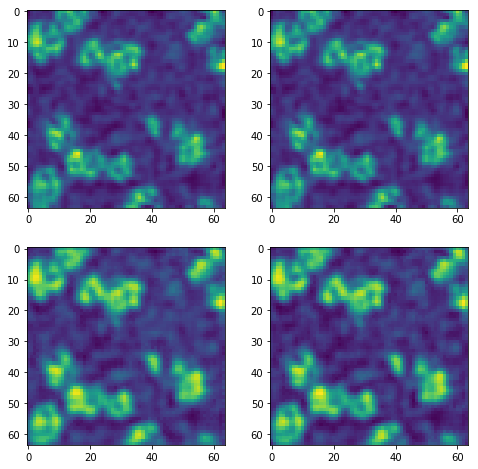

In [10]:
z=2
ix=random.randint(1,90)
print(ix)
ix=0
utils.plot_2x2(sub_validation_data[ix,z,:,:], sub_validation_truth[ix,z,:,:,1], (0.01+results[ix,z,:,:,0]), (0.01+results[ix,z,:,:,1]))
z=z+1



Trying on Bony images

In [94]:
sub_validation_data.shape

(100, 64, 64)

In [56]:
blobs=read_tiff('3DPlanariaD.tif',16)
blobs=blobs.reshape([1,16,64,64])
blobs=(blobs-np.mean(blobs))/np.std(blobs)
blobs=((blobs*.34+0.13))
blobgarb=sub_validation_truth[0:1,:,:,:,:]
print(np.mean(blobs))
print(np.std(blobs))
blobgarb.shape
blobs.shape

0.13
0.3400000000000001


(1, 16, 64, 64)

In [57]:
results, LN,losses=sess.run([probs, LSQ, loss], feed_dict={x:blobs, y:blobgarb})

1

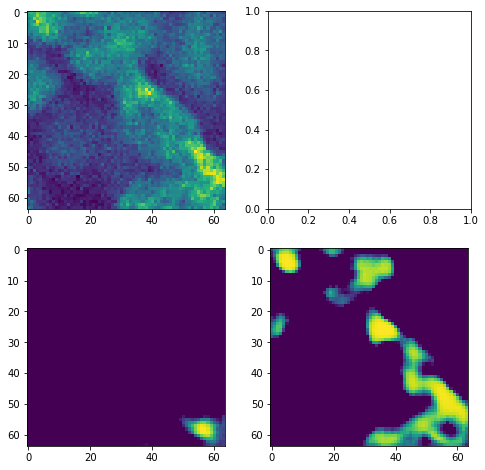

In [58]:
z=5

f,axes=plt.subplots(2,2, figsize=(8,8))
axes[0,0].imshow(blobs[0,z,:,:])
#axes[0,1].imshow(blobgarb[0,:,:,1])
axes[1,0].imshow((0.01+results[0,z,:,:,0]))
axes[1,1].imshow((0.5+results[0,z,:,:,1]))
ix=ix+1
ix

In [59]:
for i in range(0,16):
    im=Image.fromarray(results[0,i,:,:,0])
    im.save('output_planariaDM/MaskB'+str(i)+'.tif', "TIFF")
    im=Image.fromarray(results[0,i,:,:,1])
    im.save('output_planariaDM/OutlineB'+str(i)+'.tif', "TIFF")
